In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  
)
from models.nnunet import nnUnet
from models.memory_unet import MemoryUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [2]:
args = {
    "base_path" : "./dataset/syntax/",
    "memory_unet":{
        "layer_count":4,
        "channel_max":256,
        "downsampling":"maxpool",
        "dropout" : False,
        "normaliztion":"BatchNorm2d",#InstanceNorm2d
        "activation" : "LeakyReLU",
        "first_layer_out_c" : 64
    },
    "image_shape" : (448,448),
    "in_c":1,
    
    "training_mode":"binary",
    "report_class_wise":True,
    "attention" : False,
    "batch_size" : 8,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 1,
    "max_channels":512,
    "loss_type":"tversky",
    "output_base_path" : "./outputs",
    "name" : "binary-tests-norm",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    ### Loss Functions
    "mask_ce_conf":{
        "imp_coef":1.0
    },
    "focal_ce_conf":{
        "gamma":2.0,
        "loss_scale":1.0,
        "imp_coef":1.0
    },
    "tversky_conf":{
        "alpha":0.9,
        "beta":0.1,
        "gamma":2.00,
        "weights":None,
        "imp_coef":1.0
    },
    "cl_dice_conf":{
        "imp_coef":1.0,
        "k":40
    },
    ### Optimizers
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
if(args["training_mode"] == "binary"):
    args["class_count"] = 2 
    class_map = {
        1:"fg"
    }

else:
    args["class_count"] = 26
    class_map = {
        1: '1',2: '2', 3: '3',4: '4',
        5: '5',6: '6',7:'9',8:'7',9:'9a',
        10:'10',11:'8',12:'10a',13:'12',14:'11',
        15:'12a',16:'12b',17:'13',18:'14',19:'14a',
        20:'14b',21:'15',22:'16',
        23: '16a',24: '16b',25: '16c',
    }

# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","mask CE-Loss",args["loss_type"],"cl dice loss"]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
if(args["training_mode"]!="binary"):
    b=0.999

    train_class_counts = [
        1200,374,375,369,303,525,537,
        198,340,70,21,310,1,61,320,129,
        63,305,107,49,127,38,232,43,48,31
    ]

    total = np.sum(train_class_counts)
    mask_ce_weights = np.log(total/np.array(train_class_counts))
    mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
    mask_ce_weights[0]=0.1

    args["mask_ce_weights"]=mask_ce_weights
    args["mask_ce_weights"]
else:
    args["mask_ce_weights"]=[0.1,1]

In [4]:
# args["t_alpha"] = [1,0.8]
args["tversky_conf"]["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    ]  
)

if(args["in_c"]==1):
    normalizer = normalize_xca
else:
    normalizer = A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
        max_pixel_value=255.0,
    )
train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:53: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:66: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(
    transform = train_transforms,
    data = train_images , 
    normalizer = normalizer,
    example_phase=False
)
valid_ds = TrainUnetDataset(
    transform = test_transforms,
    data = valid_images,
    normalizer = normalizer,
    example_phase=False
)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False
)


In [8]:

# model = nnUnet(args).to(args["device"])
model = MemoryUnet(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


encoder info : 
[1, 64, 128, 256, 256]
-----------------------
loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (0)
total loss : 1.3571494455337525 - mask CE-Loss : 0.4213887590169907 - tversky : 0.4138427408933639
cl dice loss : 0.5219179444313049 - 
train avg metrics for epoch 0 :
avg dice : 0.40728938579559326 - avg precision : 0.3092747926712036 - avg recall : 0.5962522029876709
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 1.4900228357315064 - mask CE-Loss : 0.572045236825943 - tversky : 0.45433219194412233
cl dice loss : 0.46364541292190553 - 
valid avg metrics for epoch 0 :
avg dice : 0.463228702545166 - avg precision : 0.3222770094871521 - avg recall : 0.8233155012130737
fg => dice : 0.463228702545166 p : 0.3222770094871521 , r : 0.8233155012130737
------------------------------------------------------------
New Best! : dice = 0.463228702545166


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (1)
total loss : 0.9631605744361877 - mask CE-Loss : 0.3271276975274086 - tversky : 0.24031211256980897
cl dice loss : 0.3957207727432251 - 
train avg metrics for epoch 1 :
avg dice : 0.6161537766456604 - avg precision : 0.5631246566772461 - avg recall : 0.680208683013916
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 0.895317816734314 - mask CE-Loss : 0.33427453637123106 - tversky : 0.21050654351711273
cl dice loss : 0.3505367374420166 - 
valid avg metrics for epoch 1 :
avg dice : 0.6471761465072632 - avg precision : 0.5577111840248108 - avg recall : 0.7708281874656677
fg => dice : 0.6471761465072632 p : 0.5577111840248108 , r : 0.7708281874656677
------------------------------------------------------------
New Best! : dice = 0.6471761465072632


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 0.8937415089607239 - mask CE-Loss : 0.29795573472976683 - tversky : 0.22016228294372558
cl dice loss : 0.3756234893798828 - 
train avg metrics for epoch 2 :
avg dice : 0.6395272016525269 - avg precision : 0.5804154276847839 - avg recall : 0.7120445966720581
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 0.8296533107757569 - mask CE-Loss : 0.2999880188703537 - tversky : 0.1788872802257538
cl dice loss : 0.35077801465988157 - 
valid avg metrics for epoch 2 :
avg dice : 0.6691416501998901 - avg precision : 0.6349217295646667 - avg recall : 0.707260251045227
fg => dice : 0.6691416501998901 p : 0.6349217295646667 , r : 0.707260251045227
------------------------------------------------------------
New Best! : dice = 0.6691416501998901


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 0.8275675110816956 - mask CE-Loss : 0.2802968971729279 - tversky : 0.19465251278877257
cl dice loss : 0.35261810159683227 - 
train avg metrics for epoch 3 :
avg dice : 0.6587170362472534 - avg precision : 0.6049579381942749 - avg recall : 0.7229624390602112
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 0.7806287002563477 - mask CE-Loss : 0.28632824718952177 - tversky : 0.1568760198354721
cl dice loss : 0.33742443561553953 - 
valid avg metrics for epoch 3 :
avg dice : 0.6826536655426025 - avg precision : 0.6509246826171875 - avg recall : 0.717634379863739
fg => dice : 0.6826536655426025 p : 0.6509246826171875 , r : 0.717634379863739
------------------------------------------------------------
New Best! : dice = 0.6826536655426025


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (4)
total loss : 0.8056806950569153 - mask CE-Loss : 0.2700501581430435 - tversky : 0.19050045466423035
cl dice loss : 0.3451300826072693 - 
train avg metrics for epoch 4 :
avg dice : 0.6653498411178589 - avg precision : 0.6112079620361328 - avg recall : 0.7300160527229309
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 0.7302202939987182 - mask CE-Loss : 0.24183933436870575 - tversky : 0.17430876553058625
cl dice loss : 0.31407219409942627 - 
valid avg metrics for epoch 4 :
avg dice : 0.6893925070762634 - avg precision : 0.5985734462738037 - avg recall : 0.812700092792511
fg => dice : 0.6893925070762634 p : 0.5985734462738037 , r : 0.812700092792511
------------------------------------------------------------
New Best! : dice = 0.6893925070762634


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (5)
total loss : 0.774104686498642 - mask CE-Loss : 0.2579533551931381 - tversky : 0.180434183716774
cl dice loss : 0.33571714782714845 - 
train avg metrics for epoch 5 :
avg dice : 0.6758590936660767 - avg precision : 0.6229102611541748 - avg recall : 0.7386457324028015
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 0.7371497738361359 - mask CE-Loss : 0.26116934478282927 - tversky : 0.15943979114294052
cl dice loss : 0.31654063701629637 - 
valid avg metrics for epoch 5 :
avg dice : 0.6937916874885559 - avg precision : 0.6252828240394592 - avg recall : 0.7791600227355957
fg => dice : 0.6937916874885559 p : 0.6252828240394592 , r : 0.7791600227355957
------------------------------------------------------------
New Best! : dice = 0.6937916874885559


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (6)
total loss : 0.7655566945075989 - mask CE-Loss : 0.26069624090194704 - tversky : 0.1725399768948555
cl dice loss : 0.33232047605514525 - 
train avg metrics for epoch 6 :
avg dice : 0.6806095242500305 - avg precision : 0.6309083104133606 - avg recall : 0.7388110756874084
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 0.7164066803455352 - mask CE-Loss : 0.2542895513772965 - tversky : 0.14251551568508147
cl dice loss : 0.31960161685943606 - 
valid avg metrics for epoch 6 :
avg dice : 0.7083461880683899 - avg precision : 0.6760247349739075 - avg recall : 0.743913471698761
fg => dice : 0.7083461880683899 p : 0.6760247349739075 , r : 0.743913471698761
------------------------------------------------------------
New Best! : dice = 0.7083461880683899


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (7)
total loss : 0.7669843726158142 - mask CE-Loss : 0.25354081594944 - tversky : 0.17994447416067125
cl dice loss : 0.3334990816116333 - 
train avg metrics for epoch 7 :
avg dice : 0.6778944730758667 - avg precision : 0.6219260096549988 - avg recall : 0.7449325323104858
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 0.7601121127605438 - mask CE-Loss : 0.29480462193489076 - tversky : 0.15530554622411727
cl dice loss : 0.31000194072723386 - 
valid avg metrics for epoch 7 :
avg dice : 0.6958681344985962 - avg precision : 0.6284181475639343 - avg recall : 0.7795382738113403
fg => dice : 0.6958681344985962 p : 0.6284181475639343 , r : 0.7795382738113403
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 0.7434458754062653 - mask CE-Loss : 0.24544159805774687 - tversky : 0.1731426113843918
cl dice loss : 0.32486166429519653 - 
train avg metrics for epoch 8 :
avg dice : 0.6840078234672546 - avg precision : 0.6289021372795105 - avg recall : 0.7496978640556335
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 0.7411027598381043 - mask CE-Loss : 0.21958379805088044 - tversky : 0.2046607357263565
cl dice loss : 0.3168582224845886 - 
valid avg metrics for epoch 8 :
avg dice : 0.678788423538208 - avg precision : 0.5737654566764832 - avg recall : 0.830872654914856
fg => dice : 0.678788423538208 p : 0.5737654566764832 , r : 0.830872654914856
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (9)
total loss : 0.7405778634548187 - mask CE-Loss : 0.24589078521728516 - tversky : 0.17214948946237565
cl dice loss : 0.3225375928878784 - 
train avg metrics for epoch 9 :
avg dice : 0.6851468086242676 - avg precision : 0.6293601989746094 - avg recall : 0.7517850995063782
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 0.7069123101234436 - mask CE-Loss : 0.2668230754137039 - tversky : 0.13844423115253449
cl dice loss : 0.30164499998092653 - 
valid avg metrics for epoch 9 :
avg dice : 0.706529438495636 - avg precision : 0.6574475169181824 - avg recall : 0.7635310292243958
fg => dice : 0.706529438495636 p : 0.6574475169181824 , r : 0.7635310292243958
------------------------------------------------------------
best result at epoch 7 with dice 0.7083461880683899


Save Model
Saving Memory
Saving All Plots


  0%|          | 0/25 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 12/12 [00:00<00:00, 3367.12it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./models/conv_lstm.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


processing ./temp_script.py


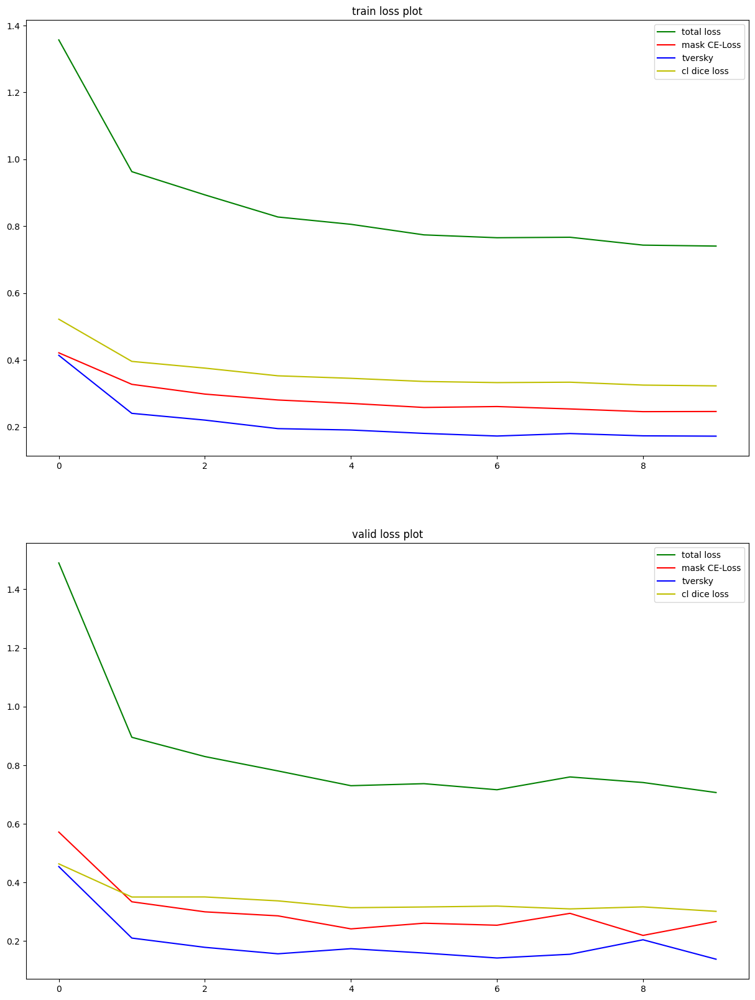

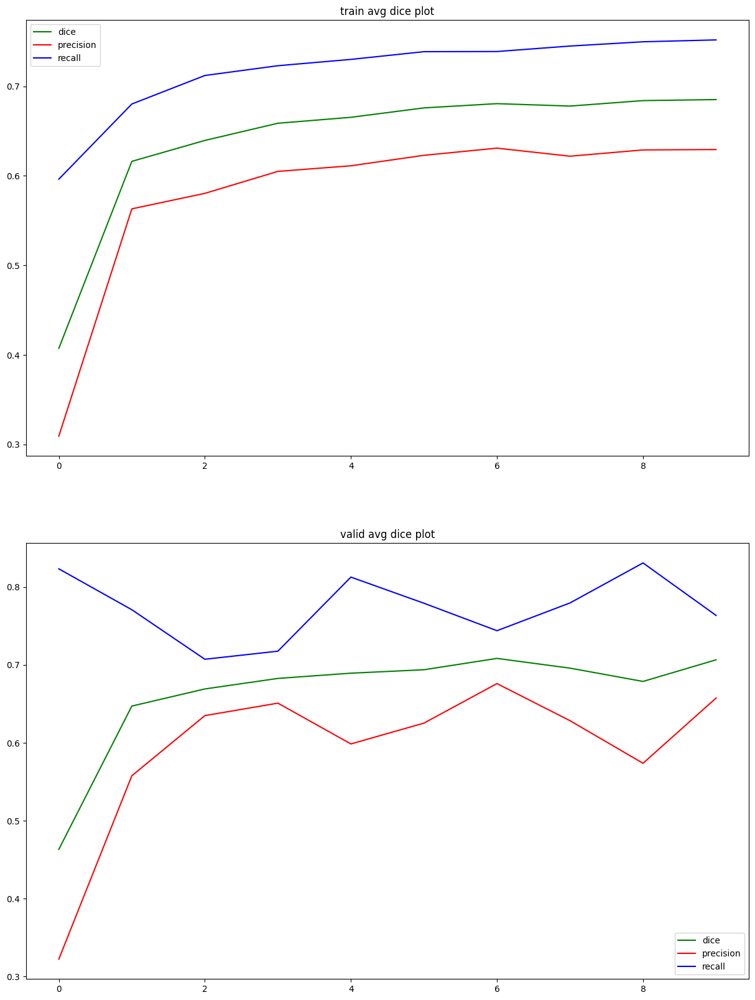

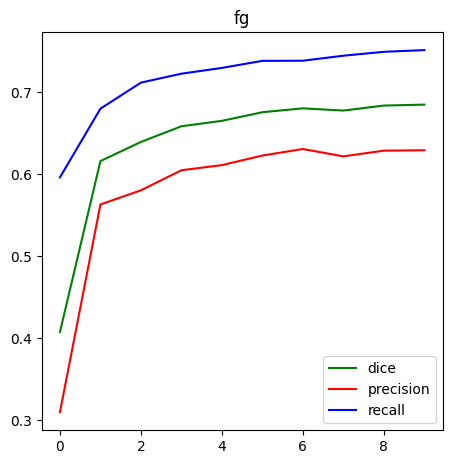

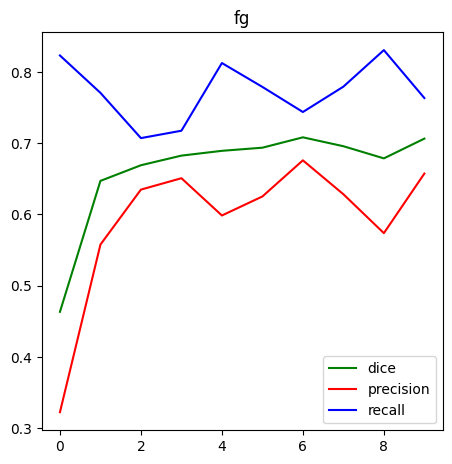

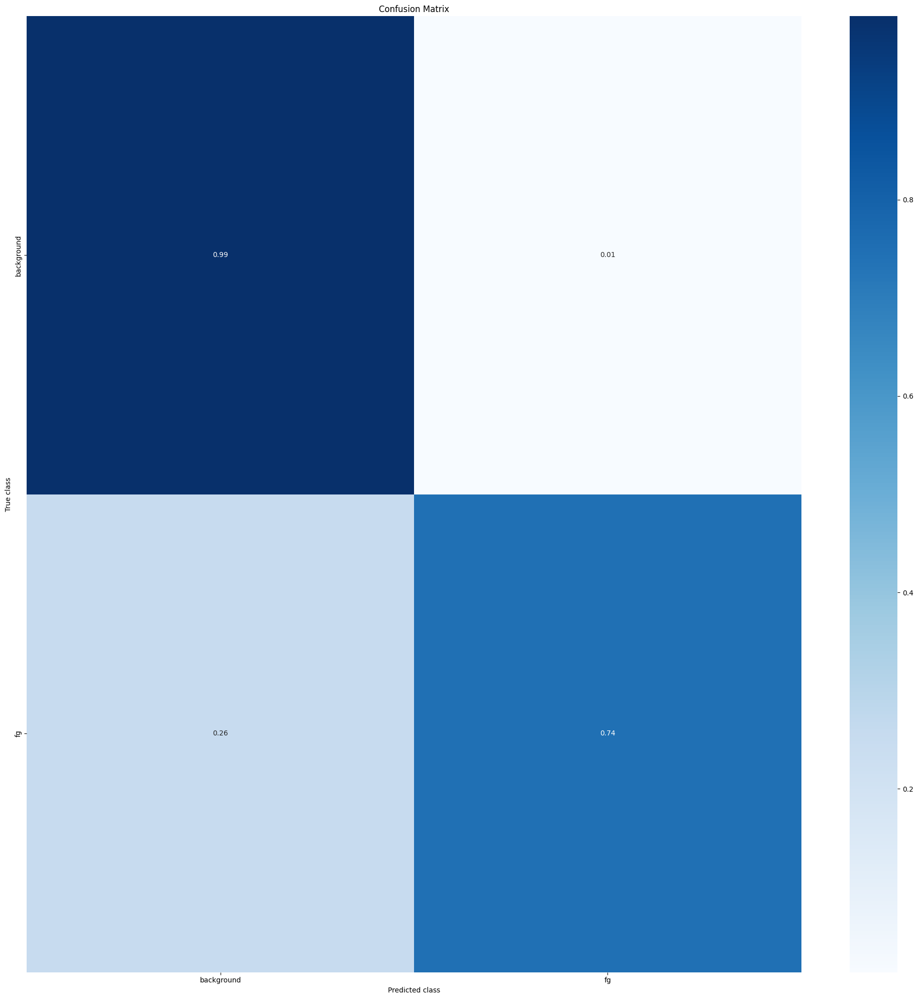

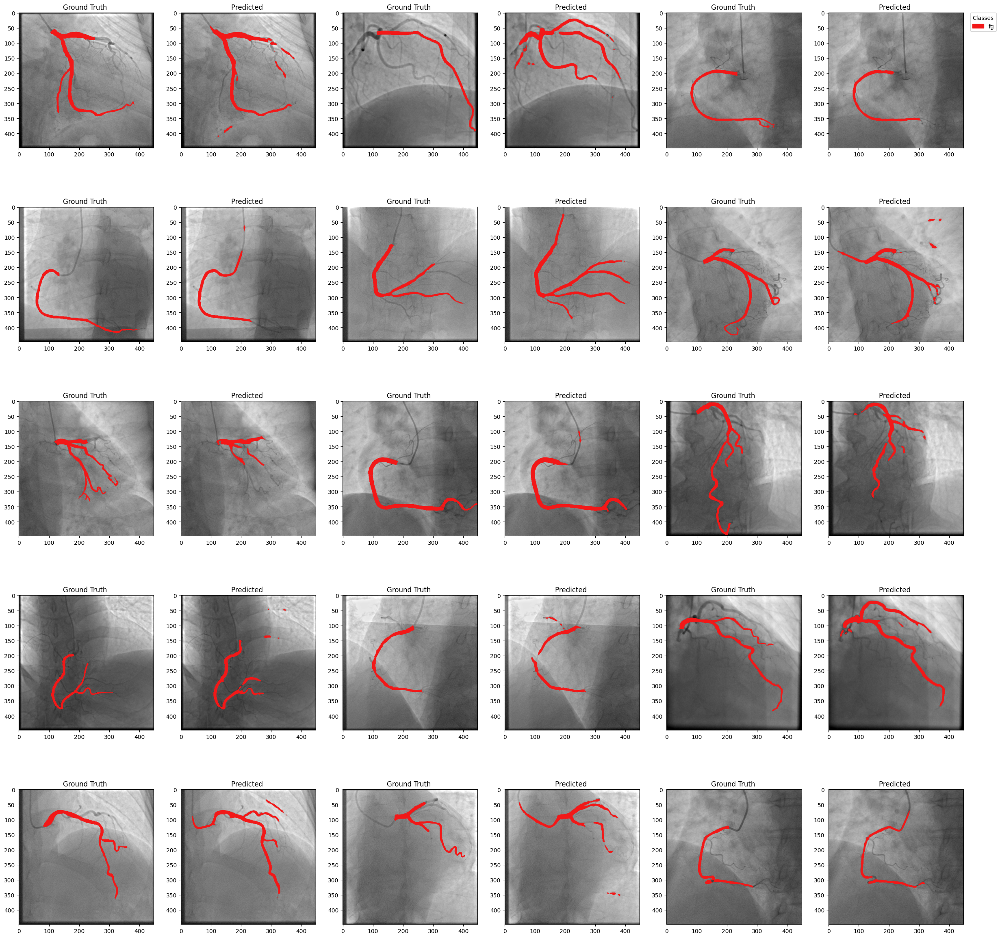

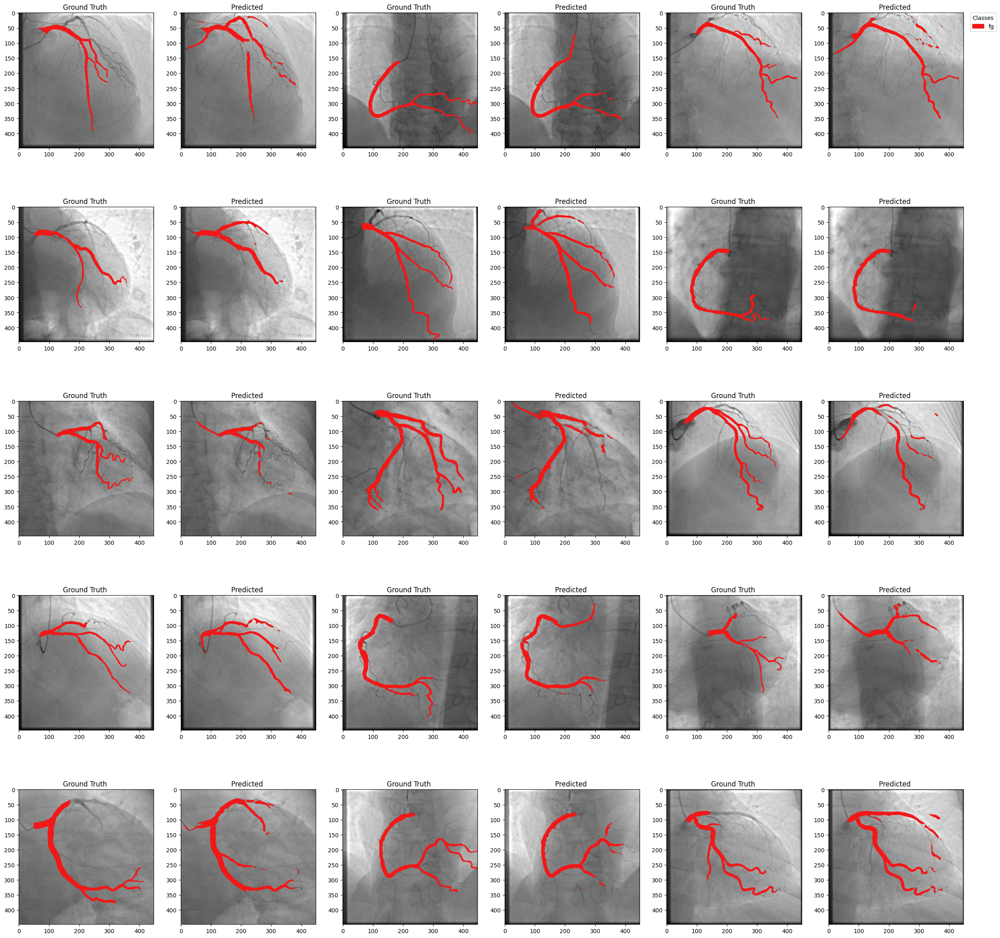

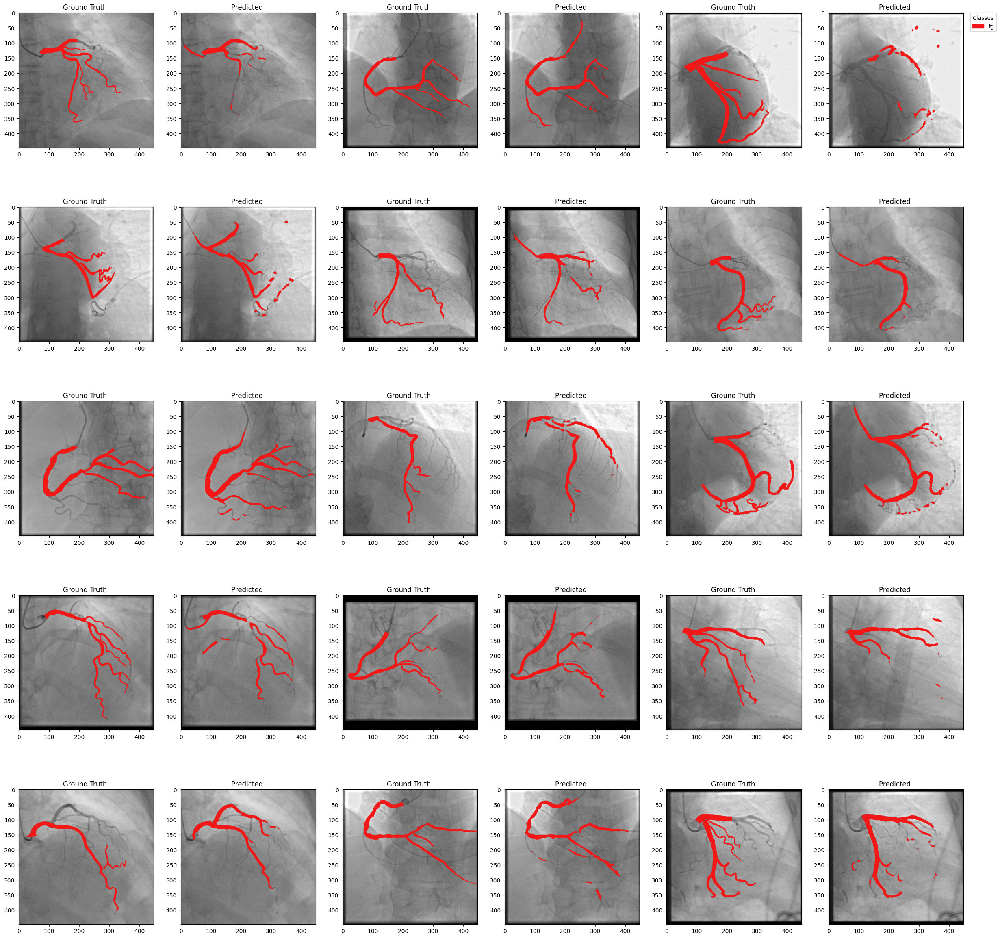

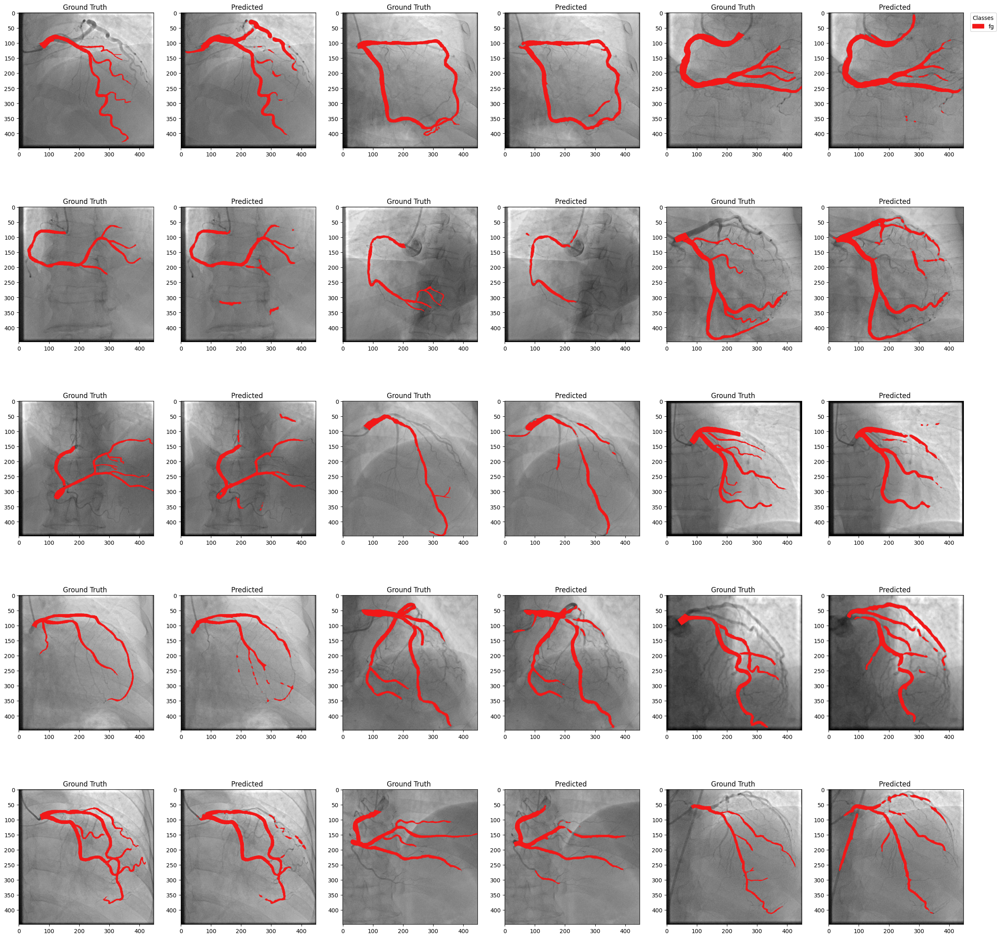

In [9]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    normalizer = normalizer,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"],
    training_mode = args["training_mode"]
)